# Seasonal Skill

In [3]:
# Check the data

df = pd.read_csv('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/TABLE_EVALMETRICS_wSEASZONE_v1.0.0.csv')

df = filter_df(df, column="SEASON", string="JJAS|ON|DJF|MAM")
df = filter_df(df, column="ZONE", string="MCZ|WG|NE|SP|NW")
df = filter_df(df, column="EXP_ID", string="L01_I03|C01")
df = df.pivot_table(index=['ZONE', 'ZONE_NAME', 'SEASON'], columns='LABEL', values='NSE')
df

LABEL                               BCSD  CNN-WMAE-i03  DENSE-WMAE-i03  \
ZONE ZONE_NAME          SEASON                                           
CNE  CENTRAL NORTHEAST  DJF     0.348543      0.408212        0.373001   
                        JJAS    0.155151      0.368744        0.367610   
                        MAM     0.235793      0.205073        0.193121   
                        ON     -0.386467      0.362078        0.370477   
MCZ  MONSOON CORE ZONE  DJF     0.403937      0.381376        0.265360   
                        JJAS    0.287226      0.415961        0.406810   
                        MAM     0.317062      0.233050        0.216897   
                        ON     -0.016210      0.444417        0.443182   
NE   NORTHEAST          DJF     0.298634      0.456652       -3.514849   
                        JJAS    0.110952      0.408210        0.413781   
                        MAM     0.089936      0.480194        0.423145   
                        ON      0.235779      0.407592        0.412805   
NW   NORTHWEST          DJF     0.402369      0.447214        0.440783   
                        JJAS    0.262930      0.398284        0.362938   
                        MAM     0.333287      0.461850        0.433747   
                        ON      0.374661      0.432289        0.416262   
SP   SOUTHERN PENINSULA DJF     0.227583      0.430630        0.399468   
                        JJAS    0.423508      0.520888        0.532249   
                        MAM     0.284498      0.295462        0.276333   
                        ON     -0.016796      0.377455        0.367563   
WG   WESTERN GHATS      DJF     0.073552      0.368356        0.360826   
                        JJAS    0.486565      0.602265        0.630004   
                        MAM     0.257323      0.477436        0.491245   
                        ON      0.278377      0.429862        0.430496   

LABEL                           FSRCNN-WMAE-i03  SRDRN1-WMAE-i03  \
ZONE ZONE_NAME          SEASON                                     
CNE  CENTRAL NORTHEAST  DJF            0.503245         0.516708   
                        JJAS           0.436241         0.434289   
                        MAM            0.272595         0.285123   
                        ON             0.442753         0.428950   
MCZ  MONSOON CORE ZONE  DJF            0.471349         0.487064   
                        JJAS           0.483565         0.474076   
                        MAM            0.315465         0.313771   
                        ON             0.518604         0.510767   
NE   NORTHEAST          DJF            0.523923         0.531410   
                        JJAS           0.432078         0.403567   
                        MAM            0.524734         0.519512   
                        ON             0.483463         0.478312   
NW   NORTHWEST          DJF            0.504759         0.487684   
                        JJAS           0.469260         0.457356   
                        MAM            0.466795         0.464327   
                        ON             0.459713         0.426826   
SP   SOUTHERN PENINSULA DJF            0.470321         0.413490   
                        JJAS           0.566637         0.497178   
                        MAM            0.406016         0.364798   
                        ON             0.439562         0.389086   
WG   WESTERN GHATS      DJF            0.406440         0.352673   
                        JJAS           0.648615         0.526275   
                        MAM            0.541956         0.510202   
                        ON             0.505599         0.457116   

LABEL                           SRDRN2-WMAE-i03  SRDRN3-WMAE-i03  \
ZONE ZONE_NAME          SEASON                                     
CNE  CENTRAL NORTHEAST  DJF            0.481561         0.461654   
                        JJAS           0.429861         0.391015   
                        MAM       

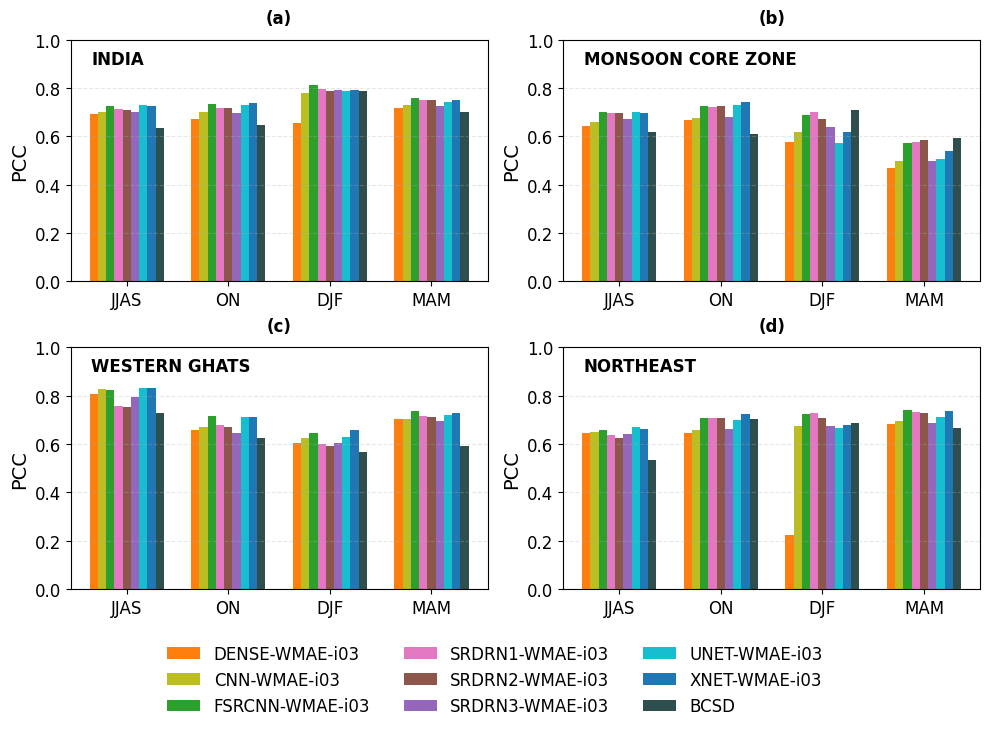

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def filter_df(df, column, string):
    """Select and merge rows from the dataframe where the specified string is present in the specified column."""
    return df[df[column].str.contains(string, na=False)]

# Read the data
df = pd.read_csv('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/TABLE_EVALMETRICS_wSEASZONE_v1.0.0.csv')

# Define regions and seasons
regions = ['IND', 'MCZ', 'WG', 'NE']
regions_names = ['INDIA', 'MONSOON CORE ZONE', 'WESTERN GHATS', 'NORTHEAST']
seasons = [ 'JJAS',  'ON', 'DJF', 'MAM',]

# Define methods (using i03 versions as per your data)
methods = ['DENSE-WMAE-i03', 
           'CNN-WMAE-i03',
           'FSRCNN-WMAE-i03',
           'SRDRN1-WMAE-i03',
           'SRDRN2-WMAE-i03', 
           'SRDRN3-WMAE-i03',
           'UNET-WMAE-i03',
           'XNET-WMAE-i03',
           'BCSD',
        ]

# Define colors
colors = [
    "#ff7f0e",  # Orange pair
    "#bcbd22",  # Yellow-green pair
    "#2ca02c",  # Green pair
    "#e377c2",  # Pink pair
    "#8c564b",  # Brown pair
    "#9467bd",  # Purple pair
    "#17becf",  # Teal pair
    "#1f77b4",  # Blue pair
    "#2F4F4F",
]

# Create figure with 3x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 7))
fig.subplots_adjust(hspace=0.25, wspace=0.1)
# fig.suptitle('PCC Scores by Region and Season', fontsize=16, fontweight='bold')

bar_width = 0.3
gap = 1
metric = 'PCC'

for idx, (region, region_name, ax) in enumerate(zip(regions, regions_names, axes.flat)):
    x = np.arange(len(seasons)) * (len(methods) * bar_width + gap)
    
    for j, method in enumerate(methods):
        season_values = []
        for season in seasons:
            value = df[(df['ZONE'] == region) & 
                      (df['SEASON'] == season) & 
                      (df['LABEL'] == method)][metric].values
            season_values.append(value[0] if len(value) > 0 else np.nan)
        
        ax.bar(x + j * bar_width, season_values, width=bar_width, 
               color=colors[j], label=method if idx == 0 else "", zorder=1)
    
    # Customize subplot
    ax.set_title(f"({chr(97 + idx)})", loc='center', fontweight='bold', pad=12)
    ax.set_ylabel(metric, fontsize=14)
    ax.set_xticks(x + (len(methods) * bar_width) / 2 - bar_width / 2)
    ax.set_xticklabels(seasons)
    ax.tick_params(axis='both', labelsize=12)
    ax.set_ylim(0, 1.0)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3, zorder=0)
    
    # Add subplot labels
    ax.text(0.05, 0.9, f"{region_name}", transform=ax.transAxes, 
            fontsize=12, fontweight='bold')

# Add single legend at the bottom
fig.legend(methods, loc='center', fontsize=12, bbox_to_anchor=(0.5, 0.02), 
          ncol=3, frameon=False)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

plt.show()

### Make the Radar Chart: PCC

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from math import pi
from matplotlib.patches import Circle

def plot_radar_plot_tab10(ax=None,
                          csv_file_path='.',
                          varname='varname',
                          label='subplot',
                          ylim=(0.5, 0.8),
                          metric_name='PCC'):
    
    zones_dict = {
        'WG': 'WESTERN GHATS',
        'MCZ': 'MONSOON CORE ZONE',
        'IND': 'INDIA',
        'NW': 'NORTHWEST',
        'CNE': 'CENTRAL NORTHEAST',
        'NE': 'NORTHEAST',
        'WC': 'WEST CENTRAL',
        'SP': 'SOUTHERN PENINSULA',
    }
    
    # Load the CSV data
    data = pd.read_csv(csv_file_path)
    
    # Get the model names from the CSV file
    model_names = data['EXP_NAME'].values
    radar_values = {model: [] for model in model_names}
    
    # Extract metric values for each model and region
    for zone in zones_dict.keys():
        for i, model in enumerate(model_names):
            radar_values[model].append(data[zones_dict[zone]].values[i])
    
    # Create DataFrame for the radar chart
    radar_data = pd.DataFrame(radar_values, index=zones_dict.keys())
    
    # Number of variables (regions) we're plotting
    num_vars = len(zones_dict)
    
    # Compute the angle of each axis
    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += angles[:1]
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    colors = [
        "#2F4F4F",
        "#ff7f0e",  # Orange pair
        "#bcbd22",  # Yellow-green pair
        "#2ca02c",  # Green pair
        "#e377c2",  # Pink pair
        "#8c564b",  # Brown pair
        "#9467bd",  # Purple pair
        "#17becf",  # Teal pair
        "#1f77b4",  # Blue pair
    ]
    
    # Store handles and labels for legend
    handles = []
    labels = []
    
    # Plot each model
    for i, model in enumerate(model_names):
        if model in radar_data.columns:
            values = radar_data[model].tolist()
            values += values[:1]
            line, = ax.plot(angles, values, linewidth=2, linestyle='-', marker='o', markersize=10, label=model,
                            color=colors[i % len(model_names)])
            ax.fill(angles, values, alpha=0, color=colors[i % len(model_names)])
            handles.append(line)  # Add line handle to the legend list
            labels.append(model)  # Add model name to the legend labels list
        else:
            print(f"Warning: Model '{model}' not found in radar_data columns.")
    
    # Set xlabels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(list(zones_dict.keys()), fontsize=15, fontweight='bold')
    
    # Set ylabels
    ax.set_ylim(ylim[0], ylim[1])
    y_ticks = np.arange(ylim[0], ylim[1] + 0.1, 0.1)  # 0.1 increments
    ax.set_yticks(y_ticks[1:-1])

    # Hide default y-tick labels
    ax.set_yticklabels([])

    # Add y-tick labels manually with a high zorder
    for tick in y_ticks[1:-1]:
        ax.text(np.pi / 9, tick, f'{tick:.1f}', ha='center', fontsize=12, fontweight='bold', color='black', zorder=12) 
    
    # Create a white circle at the center
    circle = Circle((0.5, 0.5), 0.07, color='white', ec='black', lw=2, transform=ax.transAxes, zorder=10)
    ax.add_patch(circle)
    
    # Add the metric name on top of the circle
    ax.text(0.5, 0.5, metric_name, ha='center', va='center', color='grey', fontsize=14, fontweight='semibold', transform=ax.transAxes, zorder=11)

    # Add label at the top right of the plot
    ax.text(0.8, 1.01, label, transform=ax.transAxes, ha='center', fontsize=16, fontweight='bold',
            bbox=dict(facecolor='yellow', edgecolor='black', boxstyle='round,pad=0.5'))

    return handles, labels  # Return handles and labels for legend

######################################################################################################################################

metric_name = "PCC"

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 12), subplot_kw=dict(polar=True))
plt.subplots_adjust(hspace=0.3, wspace=0.3)

varname_dict = {
    "RMONMEAN": ["MonMean", (0.74, 1)],
    "R50MON": ["R50Mon", (0.74, 1)],
    "R90MON": ["R90Mon", (0.74, 1)],
    "R95MON": ["R95Mon", (0.5, 0.99)],
    "R99MON": ["R99Mon", (0.5, 0.9)],
    "RX1DAYMON": ["Rx1Day", (0.5, 0.9)],
}

DATA_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/CLIMATE_INDICES.L01.I03"
mark_list = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)',]

# Get model names and plot handles for the legend
handles_list = []
labels_list = []
for i, (ax, (varname, (varlabel, ylim))) in enumerate(zip(axs.flat, varname_dict.items())):
    csv_file_path = f"{DATA_PATH}/P07A_CLIMATE_INDICES_{varname}_{metric_name}_v1.csv"
    handles, labels = plot_radar_plot_tab10(ax=ax, csv_file_path=csv_file_path, varname=varname, ylim=ylim, label=varlabel)
    handles_list.extend(handles)
    labels_list.extend(labels)
    ax.text(0.04, 1.1, mark_list[i], transform=ax.transAxes, fontsize=30, color='k', fontweight='bold')

# Create a common legend using the handles and labels from the first subplot
fig.legend(handles=handles_list[:9], labels=labels_list[:9], loc='lower center', bbox_to_anchor=(0.5, -0.07), ncol=3, fontsize=20)

# Save and show plot

SAVE_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS"
plt.savefig(f'{SAVE_PATH}/Figure_RadarPlot_ClimIndices_{metric_name}.png', 
            format='png', dpi=600, bbox_inches='tight', facecolor='w', edgecolor='w')

plt.show()


## Plot Annual Cycle

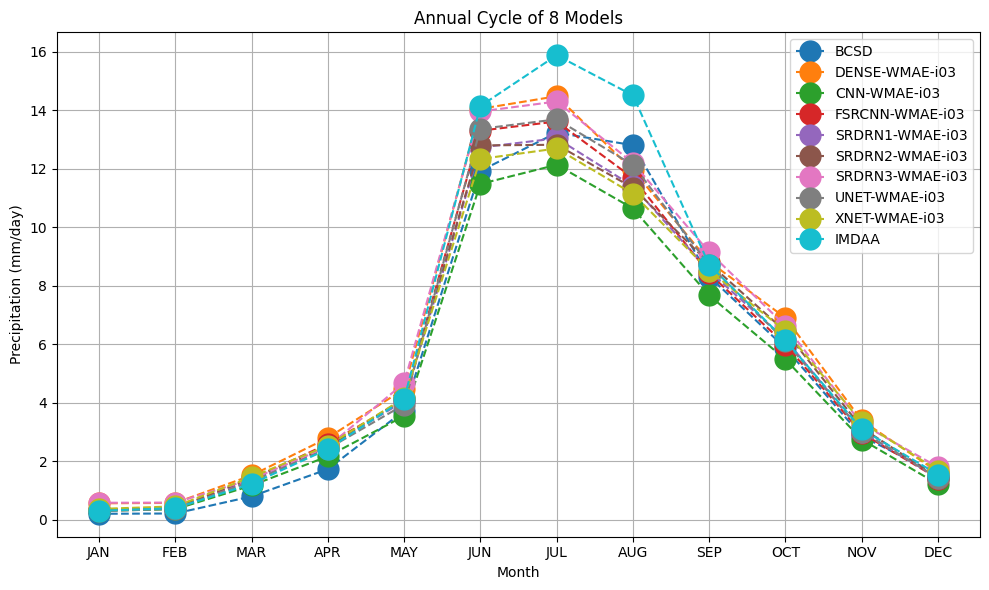

In [13]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

model_dict = {
    'C01': 'BCSD',
    'N01_L01_I03': 'DENSE-WMAE-i03',
    'N02_L01_I03': 'CNN-WMAE-i03',
    'N03_L01_I03': 'FSRCNN-WMAE-i03',
    'S01_L01_I03': 'SRDRN1-WMAE-i03',
    'S02_L01_I03': 'SRDRN2-WMAE-i03', 
    'S03_L01_I03': 'SRDRN3-WMAE-i03', 
    'U01_L01_I03': 'UNET-WMAE-i03', 
    'U02_L01_I03': 'XNET-WMAE-i03', 
    'REF': 'IMDAA',
}

MASK_PATH = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES'
mask_dict = {
    'IND': [f'{MASK_PATH}/India.nc', 'INDIA'], 
    'MCZ': [f'{MASK_PATH}/Monsoon_Core_Zone.nc', 'MONSOON CORE ZONE'], 
    'WG' : [f'{MASK_PATH}/Western_Ghats.nc' , 'WESTERN GHATS'], 
    # 'SP' : [f'{MASK_PATH}/South_Peninsular.nc' , 'SOUTHERN PENINSULA'], 
    # 'CNE': [f'{MASK_PATH}/Central_Northeast.nc', 'CENTRAL NORTHEAST'], 
    'NE' : [f'{MASK_PATH}/Northeast.nc' , 'NORTHEAST'], 
    # 'WC' : [f'{MASK_PATH}/West_Central.nc' , 'WEST CENTRAL'], 
    # 'NW' : [f'{MASK_PATH}/Northwest.nc' , 'NORTHWEST'], 

}
DATA_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
ds = xr.open_dataset(f"{DATA_PATH}/P07A_ANNCYCLE_v1.nc")

months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']
#######################################################################################################

fig, ax = plt.subplots(figsize=(10, 6))

maskarray = xr.open_dataset(mask_dict['WG'][0]).mask

for model_id, label in model_dict.items():
    dataarray = ds[f"{model_id}_ANNCYCLE"]
    data = mask_array(dataarray, maskarray)
    data = data.mean(dim = ["lat", "lon"])
    ax.plot(months, data, label=label, linestyle='--', markersize=15, marker='o')

# Customize plot
ax.set_xlabel('Month')
ax.set_ylabel('Precipitation (mm/day)')
ax.set_title('Annual Cycle of 8 Models')
ax.legend(loc='best')
ax.grid(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


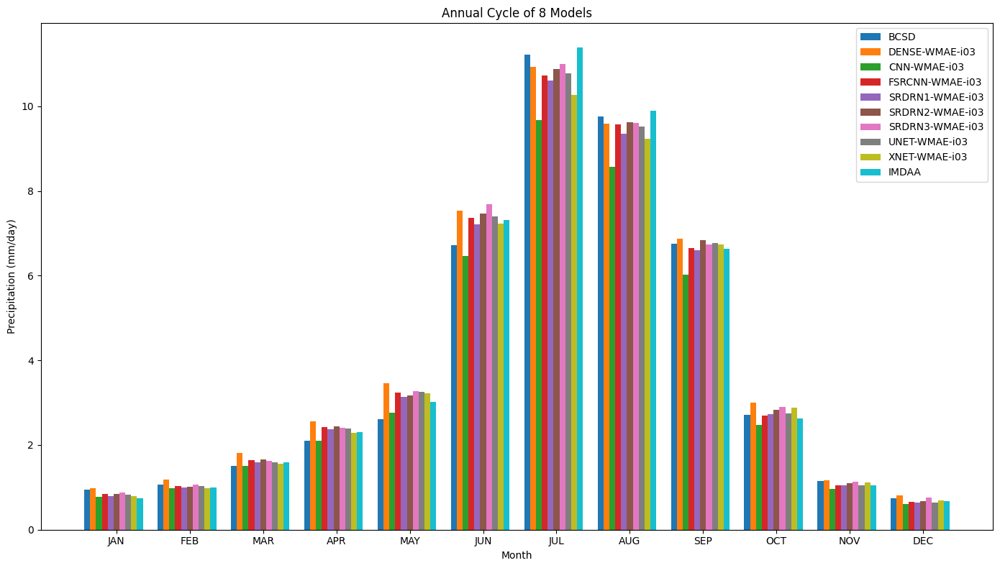

In [15]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray * maskarray

model_dict = {
    'C01': 'BCSD',
    'N01_L01_I03': 'DENSE-WMAE-i03',
    'N02_L01_I03': 'CNN-WMAE-i03',
    'N03_L01_I03': 'FSRCNN-WMAE-i03',
    'S01_L01_I03': 'SRDRN1-WMAE-i03',
    'S02_L01_I03': 'SRDRN2-WMAE-i03', 
    'S03_L01_I03': 'SRDRN3-WMAE-i03', 
    'U01_L01_I03': 'UNET-WMAE-i03', 
    'U02_L01_I03': 'XNET-WMAE-i03', 
    'REF': 'IMDAA',
}

MASK_PATH = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES'
mask_dict = {
    'IND': [f'{MASK_PATH}/India.nc', 'INDIA'], 
    'MCZ': [f'{MASK_PATH}/Monsoon_Core_Zone.nc', 'MONSOON CORE ZONE'], 
    'WG' : [f'{MASK_PATH}/Western_Ghats.nc' , 'WESTERN GHATS'], 
    'NE' : [f'{MASK_PATH}/Northeast.nc' , 'NORTHEAST'], 
}

DATA_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
ds = xr.open_dataset(f"{DATA_PATH}/P07A_ANNCYCLE_v1.nc")

months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

# Prepare data for bar plot
maskarray = xr.open_dataset(mask_dict['IND'][0]).mask
monthly_data = []

for model_id in model_dict:
    dataarray = ds[f"{model_id}_ANNCYCLE"]
    masked_data = mask_array(dataarray, maskarray)
    mean_monthly_data = masked_data.mean(dim=["lat", "lon"]).values
    monthly_data.append(mean_monthly_data)

# Convert to DataFrame for easy plotting
df = pd.DataFrame(monthly_data, index=model_dict.values(), columns=months)

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))
bar_width = 0.08
x = np.arange(len(months))

# Create a grouped bar plot
for i, (model, label) in enumerate(model_dict.items()):
    ax.bar(x + i * bar_width, df.loc[label], width=bar_width, label=label)

# Customize plot
ax.set_xticks(x + bar_width * len(model_dict) / 2)
ax.set_xticklabels(months)
ax.set_xlabel('Month')
ax.set_ylabel('Precipitation (mm/day)')
ax.set_title('Annual Cycle of 8 Models')
ax.legend(loc='best')
ax.grid(False)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


## QQ Plot

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

model_dict = {
    'REF': 'IMDAA',
    'C01': 'BCSD',
    'N01_L01_I03': 'DENSE-WMAE-i03',
    'N02_L01_I03': 'CNN-WMAE-i03',
    'N03_L01_I03': 'FSRCNN-WMAE-i03',
    'S01_L01_I03': 'SRDRN1-WMAE-i03',
    'S02_L01_I03': 'SRDRN2-WMAE-i03', 
    'S03_L01_I03': 'SRDRN3-WMAE-i03', 
    'U01_L01_I03': 'UNET-WMAE-i03', 
    'U02_L01_I03': 'XNET-WMAE-i03', 
}

MASK_PATH = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES'
mask_dict = {
    'IND': [f'{MASK_PATH}/India.nc', 'INDIA'], 
    'MCZ': [f'{MASK_PATH}/Monsoon_Core_Zone.nc', 'MONSOON CORE ZONE'], 
    'WG' : [f'{MASK_PATH}/Western_Ghats.nc' , 'WESTERN GHATS'], 
    # 'SP' : [f'{MASK_PATH}/South_Peninsular.nc' , 'SOUTHERN PENINSULA'], 
    # 'CNE': [f'{MASK_PATH}/Central_Northeast.nc', 'CENTRAL NORTHEAST'], 
    'NE' : [f'{MASK_PATH}/Northeast.nc' , 'NORTHEAST'], 
    # 'WC' : [f'{MASK_PATH}/West_Central.nc' , 'WEST CENTRAL'], 
    # 'NW' : [f'{MASK_PATH}/Northwest.nc' , 'NORTHWEST'], 

}
DATA_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
ds = xr.open_dataset(f"{DATA_PATH}/P07A_DAYMEAN_v1.nc")

#######################################################################################################


fig, ax = plt.subplots(figsize=(10, 6))

mask = xr.open_dataset(mask_dict['WG'][0]).mask

obs_data = ds["REF_DAYMEAN"]
obs_data = mask_array(obs_data, mask)
obs_data = obs_data.mean(dim = ["lat", "lon"])

for model_id, label in model_dict.items():
    pred_data = ds[f"{model_id}_DAYMEAN"]
    pred_data = mask_array(pred_data, mask)
    pred_data = pred_data.mean(dim = ["lat", "lon"])
    ax.scatter(obs_data, pred_data, label=label, marker='o')

# Customize plot
ax.set_xlabel('Month')
ax.set_ylabel('Precipitation (mm/day)')
ax.set_title('Annual Cycle of 8 Models')
ax.legend(loc='best')
ax.grid(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


## Relative Error Boxplots

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xarray as xr


# Model and Mask paths (same as in your code)
model_dict = {
    'REF': 'IMDAA',
    'C01': 'BCSD',
    'N01_L01_I03': 'DENSE-WMAE-i03',
    'N02_L01_I03': 'CNN-WMAE-i03',
    'N03_L01_I03': 'FSRCNN-WMAE-i03',
    'S01_L01_I03': 'SRDRN1-WMAE-i03',
    'S02_L01_I03': 'SRDRN2-WMAE-i03', 
    'S03_L01_I03': 'SRDRN3-WMAE-i03', 
    'U01_L01_I03': 'UNET-WMAE-i03', 
    'U02_L01_I03': 'XNET-WMAE-i03', 
}

DATA_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
ds = xr.open_dataset(f"{DATA_PATH}/P07A_SELMODELS_v1.nc")

# Maharashtra,Mumbai,19.07609,72.877426
# Delhi,New Delhi,28.6448,77.216721
# Telangana,Hyderabad,17.38714,78.491684
# Tamil Nadu,Chennai,13.067439,80.237617
# Odisha,Bhubaneshwar,20.296059,85.824539
# Meghalaya,Shillong,25.56892,91.88313
# Madhya Pradesh,Bhopal,23.259933,77.412613
# Kerala,Kochi,9.931233,76.267303


lonlat = (13.067439,80.237617)

# Prepare for boxplot
relative_errors = []

obs_data = ds["REF"]
obs_data = obs_data.sel(lat=lonlat[0], lon=lonlat[1], method='nearest')

# Calculate relative error for each model
for model_id, label in model_dict.items():

    # if model_id=="REF":
    #     continue
    pred_data = ds[model_id]
    pred_data = pred_data.sel(lat=lonlat[0], lon=lonlat[1], method='nearest')
    
    # Calculate relative error (absolute difference between observed and predicted)
    relative_error = obs_data - pred_data
    relative_errors.append(relative_error.values)

# Convert to a DataFrame for easy plotting with seaborn
relative_errors_df = pd.DataFrame(relative_errors).T  # Transpose to match models as columns

# Plotting
plt.figure(figsize=(10, 6))

# Create the boxplot without outliers
sns.boxplot(data=relative_errors_df, color='skyblue', showfliers=False)

# Set the x-tick labels to the model names from the model_dict
plt.xticks(ticks=np.arange(len(model_dict)), labels=list(model_dict.values()), rotation=45)

# Customize plot
plt.title("Boxplot of  Error (%) Between Observed and Predicted Precipitation")
plt.ylabel("Relative Error (%)")
plt.xlabel("Models")

# Show plot
plt.tight_layout()
plt.show()


## Plot Spatial Maps

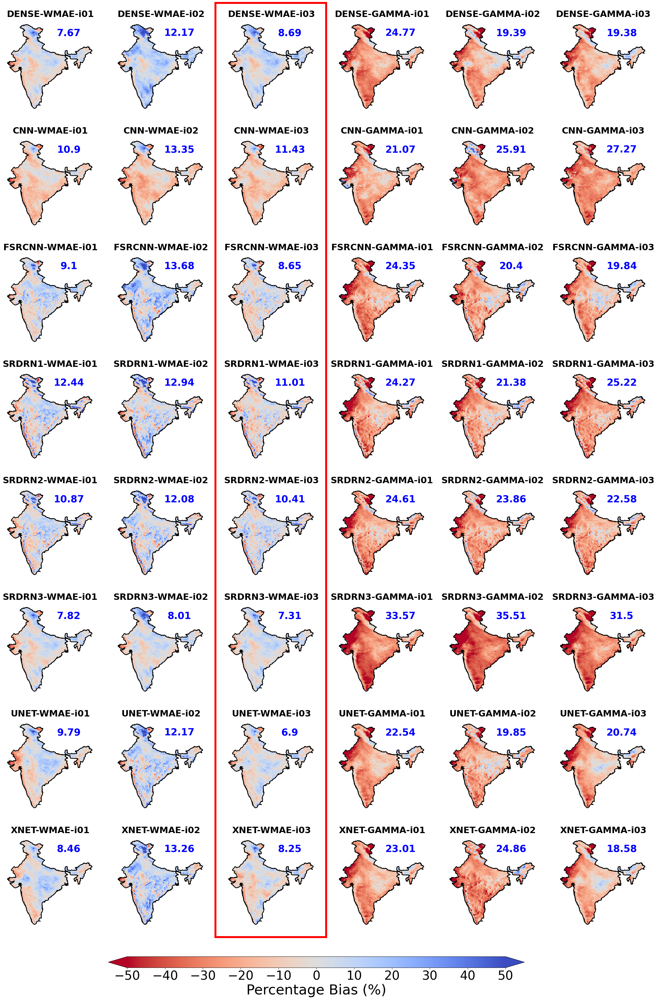

In [2]:
## Masked spatial plots
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.patches import PathPatch
import cmaps
from shapely.geometry import box
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches

#################### Calculate metric value ####################

def abs_mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(abs(arr))
    return arr

def mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(arr)
    return arr

def create_axes(nrows, ncols, figsize=(13,13), hspace=None, wspace=None):
    
    # Create figure and axis objects
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(nrows, ncols, figure=fig, hspace=hspace) #  , wspace=wspace hspace=0.5, wspace=0

    # Create subplots with specific projection using GridSpec
    axes = []
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
            axes.append(ax)
    # fig.tight_layout()

    # fig.tight_layout(pad=0) 
    # plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    return fig, axes

def get_lon_lat(ds, data_var):
    """
    Extract longitude and latitude values from 
    xarray array and variable name
    """
    
    data_coords = ds[data_var].coords
    lon_var, lat_var = None, None

    for coord_name, coord_var in data_coords.items():
        if 'longitude' in coord_var.standard_name or 'lon' in coord_var.standard_name:
            lon_var = coord_var
        elif 'latitude' in coord_var.standard_name or 'lat' in coord_var.standard_name:
            lat_var = coord_var

    return lon_var, lat_var

def filter_df(df, column, string):
    """ Select and merge rows from the dataframe where the specified string is present in the specified column""" 
    filtered_df = df[df[column].str.contains(string, na=False)]
    return filtered_df

def df_to_dict(df, key_col, value_cols):
    """
    Convert multiple columns of a DataFrame into a dictionary with lists of values.
    """
    return df.set_index(key_col)[value_cols].T.to_dict('list')

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

def my_custom_subplot(ax, ds, lonlat, cmap, vmin, vmax, 
                      title=None, ylabel=None, 
                      text=None, text_loc=None, 
                      overlay_pval=False, pval_data=None, 
                     ):
    
    # Plot data ds1 with inverted y-axis
    im = ax.imshow(ds, 
                   cmap=cmap, 
                   alpha=1.0, 
                   vmin=vmin, 
                   vmax=vmax,
                   extent=[lonlat[0].data.min(), 
                           lonlat[0].data.max(),
                           lonlat[1].data.max(),
                           lonlat[1].data.min()], 
                   origin='upper', 
                   transform=ccrs.PlateCarree()
                  )
    # ---------------
    # Add coastlines
    # ---------------
    # ax.coastlines(resolution='50m')
    ax.invert_yaxis()
    
    # --------------------
    # Add India shapefile
    # --------------------
    shapefile_path = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/SHAPEFILES/India.shp"         
    shapefile_df = gpd.read_file(shapefile_path)
    countries = shapefile_df['geometry']
    ax.add_geometries(countries, ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=2)

    # -----------------------
    # Overlay pvalue hatches 
    # -----------------------
    if overlay_pval:

        if pval_data is None:
            raise ValueError('You have asked to plot pval stipples, but no data passed.')
        else:
            significance_threshold = 0.01
            significant_mask = pval_data <= significance_threshold
        

    
        # Overlay hatched polygons for significant correlations
        bbox = box(lonlat[0].data.min(), lonlat[1].data.min(), lonlat[0].data.max(), lonlat[1].data.max())
        for geom in countries:
            if bbox.intersects(geom):
                masked_geom = geom.intersection(bbox)
                if masked_geom.is_empty:
                    continue   
                if significant_mask.sel(longitude=slice(masked_geom.bounds[0], masked_geom.bounds[2]),
                                         latitude=slice(masked_geom.bounds[1], masked_geom.bounds[3])).any():
                    ax.add_geometries([masked_geom], 
                                      ccrs.PlateCarree(), 
                                      facecolor='none', 
                                      edgecolor='k', 
                                      hatch='.', 
                                      linewidth=1)
                    continue
    
    # -------------------------
    # Add text inside the plot
    # -------------------------
    if text is not None:
        ax.text(text_loc[0], text_loc[1], 
                text, 
                transform=ax.transAxes, ha='center', va='center', 
                fontsize=25, fontweight='bold', 
                color='blue', backgroundcolor=None, bbox=None)

    # ------------------------------
    # Additional plot customization
    # ------------------------------
    ax.set_title(title, loc='center', fontsize=23, fontweight='semibold')
    ax.set_ylabel(ylabel, loc='center', fontsize=22, fontweight='semibold')
    ax.set_xticks(np.arange(70, 100, 5), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(10, 40, 5), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=False)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis="both", labelsize=12)

    ax.set_axis_off()
    
    return im


#-----------------------------------------------------------------------
######################## Main run control below ########################
#-----------------------------------------------------------------------

# Create axes for subplots and set lonlat limits
fig, axes = create_axes(nrows=8, ncols=6, figsize=(30,40), hspace=0.1, wspace=None)
lon_l, lat_l = (70, 98, 5), (10, 38, 5)

# Load datafiles
DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
d = xr.open_dataset(f'{DPATH}/EVAL_METRICS_SPATIAL_v1.nc')
df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")

m = xr.open_dataset('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES/India.nc')

varname = 'PBIAS'
cbar_label = 'Percentage Bias (%)'

DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"

df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")
df = filter_df(df, column='ZONE_NAME', string="INDIA")
# df = filter_df(df, column='EXP_ID', string="L01")

exp_dict = df_to_dict(df, key_col="EXP_ID", value_cols=["LABEL", varname])

if 'C01' in exp_dict:
    del exp_dict['C01']  # This will safely remove 'b' without changing the dictionary to a lis

#-----------------------------------------------------------------------
############################# Edit below ###############################
#-----------------------------------------------------------------------

cmap = 'coolwarm_r' #cmaps.GMT_panoply
vmin, vmax, inc = -50, 50, 10



for i, (exp_id, (title, metric_val)) in enumerate(exp_dict.items()):
    
    my_var = f'{exp_id}_{varname}'
    ds_f = mask_array(d[my_var].squeeze(), m['mask'].squeeze())
    im = my_custom_subplot(ax=axes[i], 
                    ds=ds_f,
                    lonlat=get_lon_lat(d, my_var), 
                    cmap=cmap, vmin=vmin, vmax=vmax,
                    text=abs_mean(ds_f.data).round(2), #round(metric_val, 3), #mean(d[my_var][:].data).round(4),
                    text_loc=[0.7, 0.85],
                    ylabel=None,
                    title=title,
                    overlay_pval=False,
                    pval_data = d[f'{exp_id}_TSTAT_PVAL'],
                    )
    
#----------------------------------------------------
# Add the rectangular box to the Figure object
#----------------------------------------------------

# Calculate the rectangle position and size to cover the third column
x = axes[2].get_position().xmin - 0.012 # x position of the third column
y = axes[-1].get_position().ymin  - 0.065  # Shift down by decreasing y position
width = axes[2].get_position().width * 1.2  # width of the third column subplot
height = (axes[2].get_position().ymax  * 1.1) - (axes[-1].get_position().ymin * 1.1)  # total height of the third column

# Add the rectangle to the figure using fig.patches
rect = patches.Rectangle((x, y), width, height, linewidth=5, edgecolor='r', facecolor='none', transform=fig.transFigure)
fig.patches.append(rect)  # Add patch to fig.patches

#----------------------------------------------------
# Uncomment below code snippet to set horizontal cbar 
#----------------------------------------------------

fig.subplots_adjust(bottom=0.05)
cbar_ax = fig.add_axes([0.25, 0.02, 0.5, 0.01])
cb = fig.colorbar(im, cax=cbar_ax, 
                  ticks=np.arange(vmin, vmax+inc, inc), 
                  orientation="horizontal", 
                  extend='both')
cb.ax.tick_params(labelsize=32)
cb.set_label(cbar_label, 
             rotation = 0, 
             fontsize = 36, 
             fontweight='normal') 

#---------------------------------------------------
# Uncomment below code snippet to set vertical cbar 
#---------------------------------------------------
# fig.subplots_adjust(bottom=0.065)
# cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.75])  # Adjust the position and size to the right side
# cb = fig.colorbar(im, cax=cbar_ax, 
#                   ticks=np.arange(vmin, vmax+inc, inc), 
#                   orientation="vertical", 
#                   extend='both') 
# cb.ax.tick_params(labelsize=18)
# cb.set_label(cbar_label, 
#              rotation=90, 
#              fontsize=20, 
#              fontweight='normal')  

#----------------------------------------------------------------
# Add numbering markers in the left upper corner of each subplot
#----------------------------------------------------------------
# ax_indices = np.arange(0,9)
# labels = ['(a)','(b)','(c)','(d)','(e)','(f)']
# for idx, label in zip(ax_indices, labels):
#     axes[idx].text(-0.1, 1.025, label, transform=axes[idx].transAxes, fontsize=16, fontweight='semibold')

SAVE_DIR = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS'
# plt.savefig(f'{SAVE_DIR}/Figure_SpatialMap_{varname.upper()}_b.png', format='png', dpi=400, bbox_inches='tight',facecolor='w', edgecolor='w')
plt.show()



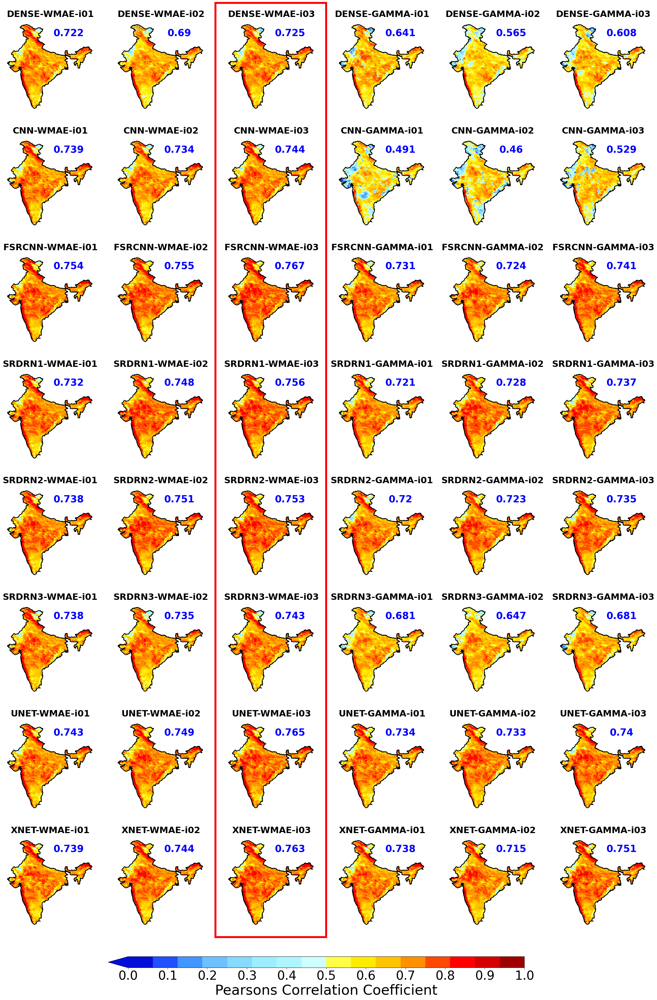

In [3]:
## Masked spatial plots
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.patches import PathPatch
import cmaps
from shapely.geometry import box
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches

#################### Calculate metric value ####################

def abs_mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(abs(arr))
    return arr

def mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(arr)
    return arr

def create_axes(nrows, ncols, figsize=(13,13), hspace=None, wspace=None):
    
    # Create figure and axis objects
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(nrows, ncols, figure=fig, hspace=hspace) #  , wspace=wspace hspace=0.5, wspace=0

    # Create subplots with specific projection using GridSpec
    axes = []
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
            axes.append(ax)
    # fig.tight_layout()

    # fig.tight_layout(pad=0) 
    # plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    return fig, axes

def get_lon_lat(ds, data_var):
    """
    Extract longitude and latitude values from 
    xarray array and variable name
    """
    
    data_coords = ds[data_var].coords
    lon_var, lat_var = None, None

    for coord_name, coord_var in data_coords.items():
        if 'longitude' in coord_var.standard_name or 'lon' in coord_var.standard_name:
            lon_var = coord_var
        elif 'latitude' in coord_var.standard_name or 'lat' in coord_var.standard_name:
            lat_var = coord_var

    return lon_var, lat_var

def filter_df(df, column, string):
    """ Select and merge rows from the dataframe where the specified string is present in the specified column""" 
    filtered_df = df[df[column].str.contains(string, na=False)]
    return filtered_df

def df_to_dict(df, key_col, value_cols):
    """
    Convert multiple columns of a DataFrame into a dictionary with lists of values.
    """
    return df.set_index(key_col)[value_cols].T.to_dict('list')

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

def my_custom_subplot(ax, ds, lonlat, cmap, vmin, vmax, 
                      title=None, ylabel=None, 
                      text=None, text_loc=None, 
                      overlay_pval=False, pval_data=None, 
                     ):
    
    # Plot data ds1 with inverted y-axis
    im = ax.imshow(ds, 
                   cmap=cmap, 
                   alpha=1.0, 
                   vmin=vmin, 
                   vmax=vmax,
                   extent=[lonlat[0].data.min(), 
                           lonlat[0].data.max(),
                           lonlat[1].data.max(),
                           lonlat[1].data.min()], 
                   origin='upper', 
                   transform=ccrs.PlateCarree()
                  )
    # ---------------
    # Add coastlines
    # ---------------
    # ax.coastlines(resolution='50m')
    ax.invert_yaxis()
    
    # --------------------
    # Add India shapefile
    # --------------------
    shapefile_path = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/SHAPEFILES/India.shp"         
    shapefile_df = gpd.read_file(shapefile_path)
    countries = shapefile_df['geometry']
    ax.add_geometries(countries, ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=2)

    # -----------------------
    # Overlay pvalue hatches 
    # -----------------------
    if overlay_pval:

        if pval_data is None:
            raise ValueError('You have asked to plot pval stipples, but no data passed.')
        else:
            significance_threshold = 0.01
            significant_mask = pval_data <= significance_threshold
        

    
        # Overlay hatched polygons for significant correlations
        bbox = box(lonlat[0].data.min(), lonlat[1].data.min(), lonlat[0].data.max(), lonlat[1].data.max())
        for geom in countries:
            if bbox.intersects(geom):
                masked_geom = geom.intersection(bbox)
                if masked_geom.is_empty:
                    continue   
                if significant_mask.sel(longitude=slice(masked_geom.bounds[0], masked_geom.bounds[2]),
                                         latitude=slice(masked_geom.bounds[1], masked_geom.bounds[3])).any():
                    ax.add_geometries([masked_geom], 
                                      ccrs.PlateCarree(), 
                                      facecolor='none', 
                                      edgecolor='k', 
                                      hatch='.', 
                                      linewidth=1)
                    continue
    
    # -------------------------
    # Add text inside the plot
    # -------------------------
    if text is not None:
        ax.text(text_loc[0], text_loc[1], 
                text, 
                transform=ax.transAxes, ha='center', va='center', 
                fontsize=25, fontweight='bold', 
                color='blue', backgroundcolor=None, bbox=None)

    # ------------------------------
    # Additional plot customization
    # ------------------------------
    ax.set_title(title, loc='center', fontsize=23, fontweight='semibold')
    ax.set_ylabel(ylabel, loc='center', fontsize=22, fontweight='semibold')
    ax.set_xticks(np.arange(70, 100, 5), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(10, 40, 5), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=False)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis="both", labelsize=12)

    ax.set_axis_off()
    
    return im


#-----------------------------------------------------------------------
######################## Main run control below ########################
#-----------------------------------------------------------------------

# Create axes for subplots and set lonlat limits
fig, axes = create_axes(nrows=8, ncols=6, figsize=(30,40), hspace=0.1, wspace=None)
lon_l, lat_l = (70, 98, 5), (10, 38, 5)

# Load datafiles
DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
d = xr.open_dataset(f'{DPATH}/EVAL_METRICS_SPATIAL_v1.nc')
df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")

m = xr.open_dataset('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES/India.nc')

varname = 'PCC'
cbar_label = 'Pearsons Correlation Coefficient'

DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"

df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")
df = filter_df(df, column='ZONE_NAME', string="INDIA")
# df = filter_df(df, column='EXP_ID', string="L01")

exp_dict = df_to_dict(df, key_col="EXP_ID", value_cols=["LABEL", varname])

if 'C01' in exp_dict:
    del exp_dict['C01']  # This will safely remove 'b' without changing the dictionary to a lis

#-----------------------------------------------------------------------
############################# Edit below ###############################
#-----------------------------------------------------------------------

cmap = cmaps.GMT_panoply
vmin, vmax, inc = 0, 1, 0.1



for i, (exp_id, (title, metric_val)) in enumerate(exp_dict.items()):
    
    my_var = f'{exp_id}_{varname}'
    ds_f = mask_array(d[my_var].squeeze(), m['mask'].squeeze())
    im = my_custom_subplot(ax=axes[i], 
                    ds=ds_f,
                    lonlat=get_lon_lat(d, my_var), 
                    cmap=cmap, vmin=vmin, vmax=vmax,
                    text=round(metric_val, 3), #mean(d[my_var][:].data).round(4), abs_mean(ds_f.data).round(2), 
                    text_loc=[0.7, 0.85],
                    ylabel=None,
                    title=title,
                    overlay_pval=False,
                    pval_data = d[f'{exp_id}_TSTAT_PVAL'],
                    )
    
#----------------------------------------------------
# Add the rectangular box to the Figure object
#----------------------------------------------------

# Calculate the rectangle position and size to cover the third column
x = axes[2].get_position().xmin - 0.012 # x position of the third column
y = axes[-1].get_position().ymin  - 0.065  # Shift down by decreasing y position
width = axes[2].get_position().width * 1.2  # width of the third column subplot
height = (axes[2].get_position().ymax  * 1.1) - (axes[-1].get_position().ymin * 1.1)  # total height of the third column

# Add the rectangle to the figure using fig.patches
rect = patches.Rectangle((x, y), width, height, linewidth=5, edgecolor='r', facecolor='none', transform=fig.transFigure)
fig.patches.append(rect)  # Add patch to fig.patches

#----------------------------------------------------
# Uncomment below code snippet to set horizontal cbar 
#----------------------------------------------------

fig.subplots_adjust(bottom=0.05)
cbar_ax = fig.add_axes([0.25, 0.02, 0.5, 0.01])
cb = fig.colorbar(im, cax=cbar_ax, 
                  ticks=np.arange(vmin, vmax+inc, inc), 
                  orientation="horizontal", 
                  extend='min')
cb.ax.tick_params(labelsize=32)
cb.set_label(cbar_label, 
             rotation = 0, 
             fontsize = 36, 
             fontweight='normal') 

#---------------------------------------------------
# Uncomment below code snippet to set vertical cbar 
#---------------------------------------------------
# fig.subplots_adjust(bottom=0.065)
# cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.75])  # Adjust the position and size to the right side
# cb = fig.colorbar(im, cax=cbar_ax, 
#                   ticks=np.arange(vmin, vmax+inc, inc), 
#                   orientation="vertical", 
#                   extend='both') 
# cb.ax.tick_params(labelsize=18)
# cb.set_label(cbar_label, 
#              rotation=90, 
#              fontsize=20, 
#              fontweight='normal')  

#----------------------------------------------------------------
# Add numbering markers in the left upper corner of each subplot
#----------------------------------------------------------------
# ax_indices = np.arange(0,9)
# labels = ['(a)','(b)','(c)','(d)','(e)','(f)']
# for idx, label in zip(ax_indices, labels):
#     axes[idx].text(-0.1, 1.025, label, transform=axes[idx].transAxes, fontsize=16, fontweight='semibold')

SAVE_DIR = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS'
# plt.savefig(f'{SAVE_DIR}/Figure_SpatialMap_{varname.upper()}_b.png', format='png', dpi=400, bbox_inches='tight',facecolor='w', edgecolor='w')
plt.show()



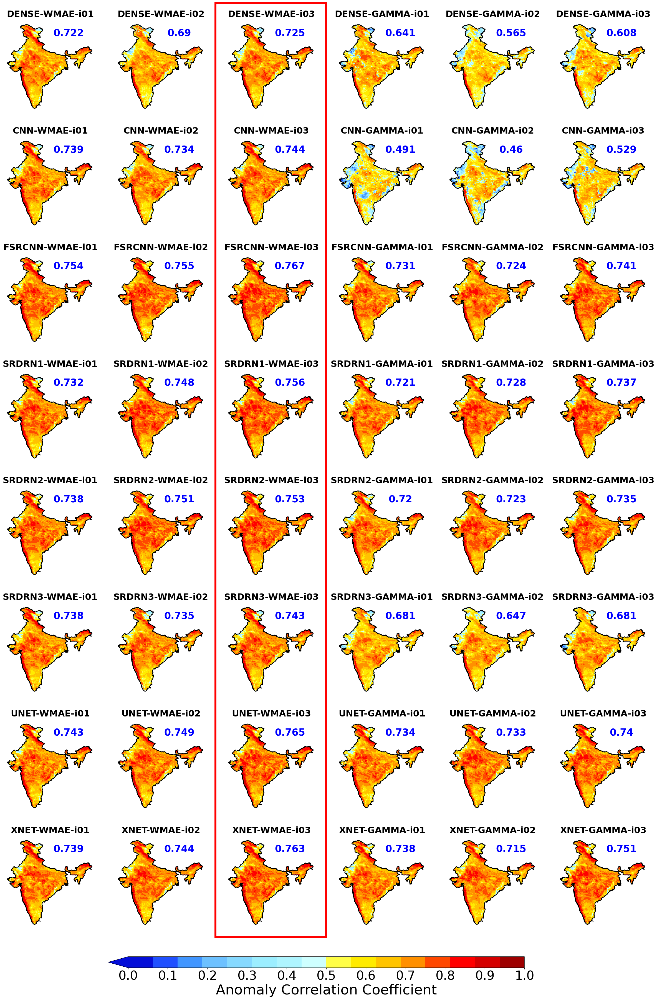

In [3]:

## Masked spatial plots
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.patches import PathPatch
import cmaps
from shapely.geometry import box
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches

#################### Calculate metric value ####################

def abs_mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(abs(arr))
    return arr

def mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(arr)
    return arr

def create_axes(nrows, ncols, figsize=(13,13), hspace=None, wspace=None):
    
    # Create figure and axis objects
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(nrows, ncols, figure=fig, hspace=hspace) #  , wspace=wspace hspace=0.5, wspace=0

    # Create subplots with specific projection using GridSpec
    axes = []
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
            axes.append(ax)
    # fig.tight_layout()

    # fig.tight_layout(pad=0) 
    # plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    return fig, axes

def get_lon_lat(ds, data_var):
    """
    Extract longitude and latitude values from 
    xarray array and variable name
    """
    
    data_coords = ds[data_var].coords
    lon_var, lat_var = None, None

    for coord_name, coord_var in data_coords.items():
        if 'longitude' in coord_var.standard_name or 'lon' in coord_var.standard_name:
            lon_var = coord_var
        elif 'latitude' in coord_var.standard_name or 'lat' in coord_var.standard_name:
            lat_var = coord_var

    return lon_var, lat_var

def filter_df(df, column, string):
    """ Select and merge rows from the dataframe where the specified string is present in the specified column""" 
    filtered_df = df[df[column].str.contains(string, na=False)]
    return filtered_df

def df_to_dict(df, key_col, value_cols):
    """
    Convert multiple columns of a DataFrame into a dictionary with lists of values.
    """
    return df.set_index(key_col)[value_cols].T.to_dict('list')

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

def my_custom_subplot(ax, ds, lonlat, cmap, vmin, vmax, 
                      title=None, ylabel=None, 
                      text=None, text_loc=None, 
                      overlay_pval=False, pval_data=None, 
                     ):
    
    # Plot data ds1 with inverted y-axis
    im = ax.imshow(ds, 
                   cmap=cmap, 
                   alpha=1.0, 
                   vmin=vmin, 
                   vmax=vmax,
                   extent=[lonlat[0].data.min(), 
                           lonlat[0].data.max(),
                           lonlat[1].data.max(),
                           lonlat[1].data.min()], 
                   origin='upper', 
                   transform=ccrs.PlateCarree()
                  )
    # ---------------
    # Add coastlines
    # ---------------
    # ax.coastlines(resolution='50m')
    ax.invert_yaxis()
    
    # --------------------
    # Add India shapefile
    # --------------------
    shapefile_path = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/SHAPEFILES/India.shp"         
    shapefile_df = gpd.read_file(shapefile_path)
    countries = shapefile_df['geometry']
    ax.add_geometries(countries, ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=2)

    # -----------------------
    # Overlay pvalue hatches 
    # -----------------------
    if overlay_pval:

        if pval_data is None:
            raise ValueError('You have asked to plot pval stipples, but no data passed.')
        else:
            significance_threshold = 0.01
            significant_mask = pval_data <= significance_threshold
        

    
        # Overlay hatched polygons for significant correlations
        bbox = box(lonlat[0].data.min(), lonlat[1].data.min(), lonlat[0].data.max(), lonlat[1].data.max())
        for geom in countries:
            if bbox.intersects(geom):
                masked_geom = geom.intersection(bbox)
                if masked_geom.is_empty:
                    continue   
                if significant_mask.sel(longitude=slice(masked_geom.bounds[0], masked_geom.bounds[2]),
                                         latitude=slice(masked_geom.bounds[1], masked_geom.bounds[3])).any():
                    ax.add_geometries([masked_geom], 
                                      ccrs.PlateCarree(), 
                                      facecolor='none', 
                                      edgecolor='k', 
                                      hatch='.', 
                                      linewidth=1)
                    continue
    
    # -------------------------
    # Add text inside the plot
    # -------------------------
    if text is not None:
        ax.text(text_loc[0], text_loc[1], 
                text, 
                transform=ax.transAxes, ha='center', va='center', 
                fontsize=25, fontweight='bold', 
                color='blue', backgroundcolor=None, bbox=None)

    # ------------------------------
    # Additional plot customization
    # ------------------------------
    ax.set_title(title, loc='center', fontsize=23, fontweight='semibold')
    ax.set_ylabel(ylabel, loc='center', fontsize=22, fontweight='semibold')
    ax.set_xticks(np.arange(70, 100, 5), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(10, 40, 5), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=False)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis="both", labelsize=12)

    ax.set_axis_off()
    
    return im


#-----------------------------------------------------------------------
######################## Main run control below ########################
#-----------------------------------------------------------------------

# Create axes for subplots and set lonlat limits
fig, axes = create_axes(nrows=8, ncols=6, figsize=(30,40), hspace=0.1, wspace=None)
lon_l, lat_l = (70, 98, 5), (10, 38, 5)

# Load datafiles
DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
d = xr.open_dataset(f'{DPATH}/EVAL_METRICS_SPATIAL_v1.nc')
df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")

m = xr.open_dataset('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES/India.nc')

varname = 'ACC'
cbar_label = 'Anomaly Correlation Coefficient'

DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"

df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")
df = filter_df(df, column='ZONE_NAME', string="INDIA")
# df = filter_df(df, column='EXP_ID', string="L01")

exp_dict = df_to_dict(df, key_col="EXP_ID", value_cols=["LABEL", varname])

if 'C01' in exp_dict:
    del exp_dict['C01']  # This will safely remove 'b' without changing the dictionary to a lis

#-----------------------------------------------------------------------
############################# Edit below ###############################
#-----------------------------------------------------------------------

cmap = cmaps.GMT_panoply
vmin, vmax, inc = 0, 1, 0.1



for i, (exp_id, (title, metric_val)) in enumerate(exp_dict.items()):
    
    my_var = f'{exp_id}_{varname}'
    ds_f = mask_array(d[my_var].squeeze(), m['mask'].squeeze())
    im = my_custom_subplot(ax=axes[i], 
                    ds=ds_f,
                    lonlat=get_lon_lat(d, my_var), 
                    cmap=cmap, vmin=vmin, vmax=vmax,
                    text=round(metric_val, 3), #mean(d[my_var][:].data).round(4), abs_mean(ds_f.data).round(2)
                    text_loc=[0.7, 0.85],
                    ylabel=None,
                    title=title,
                    overlay_pval=False,
                    pval_data = d[f'{exp_id}_TSTAT_PVAL'],
                    )
    
#----------------------------------------------------
# Add the rectangular box to the Figure object
#----------------------------------------------------

# Calculate the rectangle position and size to cover the third column
x = axes[2].get_position().xmin - 0.012 # x position of the third column
y = axes[-1].get_position().ymin  - 0.065  # Shift down by decreasing y position
width = axes[2].get_position().width * 1.2  # width of the third column subplot
height = (axes[2].get_position().ymax  * 1.1) - (axes[-1].get_position().ymin * 1.1)  # total height of the third column

# Add the rectangle to the figure using fig.patches
rect = patches.Rectangle((x, y), width, height, linewidth=5, edgecolor='r', facecolor='none', transform=fig.transFigure)
fig.patches.append(rect)  # Add patch to fig.patches

#----------------------------------------------------
# Uncomment below code snippet to set horizontal cbar 
#----------------------------------------------------

fig.subplots_adjust(bottom=0.05)
cbar_ax = fig.add_axes([0.25, 0.02, 0.5, 0.01])
cb = fig.colorbar(im, cax=cbar_ax, 
                  ticks=np.arange(vmin, vmax+inc, inc), 
                  orientation="horizontal", 
                  extend='min')
cb.ax.tick_params(labelsize=32)
cb.set_label(cbar_label, 
             rotation = 0, 
             fontsize = 36, 
             fontweight='normal') 

#---------------------------------------------------
# Uncomment below code snippet to set vertical cbar 
#---------------------------------------------------
# fig.subplots_adjust(bottom=0.065)
# cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.75])  # Adjust the position and size to the right side
# cb = fig.colorbar(im, cax=cbar_ax, 
#                   ticks=np.arange(vmin, vmax+inc, inc), 
#                   orientation="vertical", 
#                   extend='both') 
# cb.ax.tick_params(labelsize=18)
# cb.set_label(cbar_label, 
#              rotation=90, 
#              fontsize=20, 
#              fontweight='normal')  

#----------------------------------------------------------------
# Add numbering markers in the left upper corner of each subplot
#----------------------------------------------------------------
# ax_indices = np.arange(0,9)
# labels = ['(a)','(b)','(c)','(d)','(e)','(f)']
# for idx, label in zip(ax_indices, labels):
#     axes[idx].text(-0.1, 1.025, label, transform=axes[idx].transAxes, fontsize=16, fontweight='semibold')

SAVE_DIR = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS'
# plt.savefig(f'{SAVE_DIR}/Figure_SpatialMap_{varname.upper()}_b.png', format='png', dpi=400, bbox_inches='tight',facecolor='w', edgecolor='w')
plt.show()



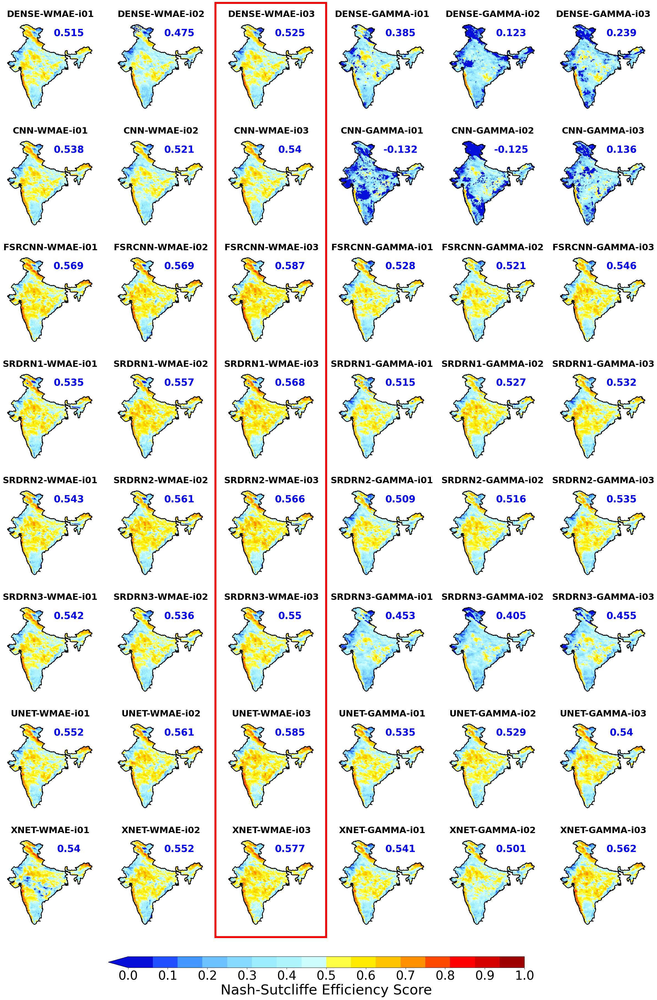

In [2]:
## Masked spatial plots
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.patches import PathPatch
import cmaps
from shapely.geometry import box
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches

#################### Calculate metric value ####################

def abs_mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(abs(arr))
    return arr

def mean(arr):
    """
    Calculates the absolute mean of a given Numpy Array
    """
    arr = arr.flatten()
    arr = np.nanmean(arr)
    return arr

def create_axes(nrows, ncols, figsize=(13,13), hspace=None, wspace=None):
    
    # Create figure and axis objects
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(nrows, ncols, figure=fig, hspace=hspace) #  , wspace=wspace hspace=0.5, wspace=0

    # Create subplots with specific projection using GridSpec
    axes = []
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
            axes.append(ax)
    # fig.tight_layout()

    # fig.tight_layout(pad=0) 
    # plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    return fig, axes

def get_lon_lat(ds, data_var):
    """
    Extract longitude and latitude values from 
    xarray array and variable name
    """
    
    data_coords = ds[data_var].coords
    lon_var, lat_var = None, None

    for coord_name, coord_var in data_coords.items():
        if 'longitude' in coord_var.standard_name or 'lon' in coord_var.standard_name:
            lon_var = coord_var
        elif 'latitude' in coord_var.standard_name or 'lat' in coord_var.standard_name:
            lat_var = coord_var

    return lon_var, lat_var

def filter_df(df, column, string):
    """ Select and merge rows from the dataframe where the specified string is present in the specified column""" 
    filtered_df = df[df[column].str.contains(string, na=False)]
    return filtered_df

def df_to_dict(df, key_col, value_cols):
    """
    Convert multiple columns of a DataFrame into a dictionary with lists of values.
    """
    return df.set_index(key_col)[value_cols].T.to_dict('list')

def mask_array(dataarray, maskarray):
    """Mask an xarray dataarray"""
    if isinstance(maskarray, xr.DataArray):
        maskarray = maskarray.values
    if dataarray.shape[1:2] != maskarray.shape[1:2]:
        raise ValueError("dataarray and maskarray must have the same shape")
    return dataarray*maskarray

def my_custom_subplot(ax, ds, lonlat, cmap, vmin, vmax, 
                      title=None, ylabel=None, 
                      text=None, text_loc=None, 
                      overlay_pval=False, pval_data=None, 
                     ):
    
    # Plot data ds1 with inverted y-axis
    im = ax.imshow(ds, 
                   cmap=cmap, 
                   alpha=1.0, 
                   vmin=vmin, 
                   vmax=vmax,
                   extent=[lonlat[0].data.min(), 
                           lonlat[0].data.max(),
                           lonlat[1].data.max(),
                           lonlat[1].data.min()], 
                   origin='upper', 
                   transform=ccrs.PlateCarree()
                  )
    # ---------------
    # Add coastlines
    # ---------------
    # ax.coastlines(resolution='50m')
    ax.invert_yaxis()
    
    # --------------------
    # Add India shapefile
    # --------------------
    shapefile_path = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/SHAPEFILES/India.shp"         
    shapefile_df = gpd.read_file(shapefile_path)
    countries = shapefile_df['geometry']
    ax.add_geometries(countries, ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=2)

    # -----------------------
    # Overlay pvalue hatches 
    # -----------------------
    if overlay_pval:

        if pval_data is None:
            raise ValueError('You have asked to plot pval stipples, but no data passed.')
        else:
            significance_threshold = 0.01
            significant_mask = pval_data <= significance_threshold
        

    
        # Overlay hatched polygons for significant correlations
        bbox = box(lonlat[0].data.min(), lonlat[1].data.min(), lonlat[0].data.max(), lonlat[1].data.max())
        for geom in countries:
            if bbox.intersects(geom):
                masked_geom = geom.intersection(bbox)
                if masked_geom.is_empty:
                    continue   
                if significant_mask.sel(longitude=slice(masked_geom.bounds[0], masked_geom.bounds[2]),
                                         latitude=slice(masked_geom.bounds[1], masked_geom.bounds[3])).any():
                    ax.add_geometries([masked_geom], 
                                      ccrs.PlateCarree(), 
                                      facecolor='none', 
                                      edgecolor='k', 
                                      hatch='.', 
                                      linewidth=1)
                    continue
    
    # -------------------------
    # Add text inside the plot
    # -------------------------
    if text is not None:
        ax.text(text_loc[0], text_loc[1], 
                text, 
                transform=ax.transAxes, ha='center', va='center', 
                fontsize=25, fontweight='bold', 
                color='blue', backgroundcolor=None, bbox=None)

    # ------------------------------
    # Additional plot customization
    # ------------------------------
    ax.set_title(title, loc='center', fontsize=23, fontweight='semibold')
    ax.set_ylabel(ylabel, loc='center', fontsize=22, fontweight='semibold')
    ax.set_xticks(np.arange(70, 100, 5), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(10, 40, 5), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=False)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis="both", labelsize=12)

    ax.set_axis_off()
    
    return im


#-----------------------------------------------------------------------
######################## Main run control below ########################
#-----------------------------------------------------------------------

# Create axes for subplots and set lonlat limits
fig, axes = create_axes(nrows=8, ncols=6, figsize=(30,40), hspace=0.1, wspace=None)
lon_l, lat_l = (70, 98, 5), (10, 38, 5)

# Load datafiles
DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"
d = xr.open_dataset(f'{DPATH}/EVAL_METRICS_SPATIAL_v1.nc')
df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")

m = xr.open_dataset('/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/MASKFILES/India.nc')

varname = 'NSE'
cbar_label = 'Nash-Sutcliffe Efficiency Score'

DPATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA"

df = pd.read_csv(f"{DPATH}/TABLE_EVALMETRICS_ALLD_v1.0.0.csv")
df = filter_df(df, column='ZONE_NAME', string="INDIA")
# df = filter_df(df, column='EXP_ID', string="L01")

exp_dict = df_to_dict(df, key_col="EXP_ID", value_cols=["LABEL", varname])

if 'C01' in exp_dict:
    del exp_dict['C01']  # This will safely remove 'b' without changing the dictionary to a lis

#-----------------------------------------------------------------------
############################# Edit below ###############################
#-----------------------------------------------------------------------

cmap = cmaps.GMT_panoply
vmin, vmax, inc = 0, 1, 0.1



for i, (exp_id, (title, metric_val)) in enumerate(exp_dict.items()):
    
    my_var = f'{exp_id}_{varname}'
    ds_f = mask_array(d[my_var].squeeze(), m['mask'].squeeze())
    im = my_custom_subplot(ax=axes[i], 
                    ds=ds_f,
                    lonlat=get_lon_lat(d, my_var), 
                    cmap=cmap, vmin=vmin, vmax=vmax,
                    text=round(metric_val, 3), #mean(d[my_var][:].data).round(4), abs_mean(ds_f.data).round(2)
                    text_loc=[0.7, 0.85],
                    ylabel=None,
                    title=title,
                    overlay_pval=False,
                    pval_data = d[f'{exp_id}_TSTAT_PVAL'],
                    )
    
#----------------------------------------------------
# Add the rectangular box to the Figure object
#----------------------------------------------------

# Calculate the rectangle position and size to cover the third column
x = axes[2].get_position().xmin - 0.012 # x position of the third column
y = axes[-1].get_position().ymin  - 0.065  # Shift down by decreasing y position
width = axes[2].get_position().width * 1.2  # width of the third column subplot
height = (axes[2].get_position().ymax  * 1.1) - (axes[-1].get_position().ymin * 1.1)  # total height of the third column

# Add the rectangle to the figure using fig.patches
rect = patches.Rectangle((x, y), width, height, linewidth=5, edgecolor='r', facecolor='none', transform=fig.transFigure)
fig.patches.append(rect)  # Add patch to fig.patches

#----------------------------------------------------
# Uncomment below code snippet to set horizontal cbar 
#----------------------------------------------------

fig.subplots_adjust(bottom=0.05)
cbar_ax = fig.add_axes([0.25, 0.02, 0.5, 0.01])
cb = fig.colorbar(im, cax=cbar_ax, 
                  ticks=np.arange(vmin, vmax+inc, inc), 
                  orientation="horizontal", 
                  extend='min')
cb.ax.tick_params(labelsize=32)
cb.set_label(cbar_label, 
             rotation = 0, 
             fontsize = 36, 
             fontweight='normal') 

#---------------------------------------------------
# Uncomment below code snippet to set vertical cbar 
#---------------------------------------------------
# fig.subplots_adjust(bottom=0.065)
# cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.75])  # Adjust the position and size to the right side
# cb = fig.colorbar(im, cax=cbar_ax, 
#                   ticks=np.arange(vmin, vmax+inc, inc), 
#                   orientation="vertical", 
#                   extend='both') 
# cb.ax.tick_params(labelsize=18)
# cb.set_label(cbar_label, 
#              rotation=90, 
#              fontsize=20, 
#              fontweight='normal')  

#----------------------------------------------------------------
# Add numbering markers in the left upper corner of each subplot
#----------------------------------------------------------------
# ax_indices = np.arange(0,9)
# labels = ['(a)','(b)','(c)','(d)','(e)','(f)']
# for idx, label in zip(ax_indices, labels):
#     axes[idx].text(-0.1, 1.025, label, transform=axes[idx].transAxes, fontsize=16, fontweight='semibold')

SAVE_DIR = '/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS'
# plt.savefig(f'{SAVE_DIR}/Figure_SpatialMap_{varname.upper()}_b.png', format='png', dpi=400, bbox_inches='tight',facecolor='w', edgecolor='w')
plt.show()



## Figure : Plot Training Times

In [5]:
# import matplotlib.pyplot as plt
# import pandas as pd

# # Load data
# df = pd.read_csv("/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/PLTDATA/P07A_CALC_MES.csv")

# # Define color palette
# colors = [
#     "#ff7f0e",  # Orange
#     "#bcbd22",  # Yellow-green
#     "#2ca02c",  # Green
#     "#e377c2",  # Pink
#     "#8c564b",  # Brown
#     "#9467bd",  # Purple
#     "#17becf",  # Teal
#     "#1f77b4",  # Blue
# ]

# # Plotting
# fig, axs = plt.subplots(3, 1, figsize=(18, 14), sharex=True)

# # Epochs till Convergence Bar Plot
# axs[0].bar(df["MODEL_NAME"], df["EPOCH_TILL_CONVERGENCE"], color=colors[:len(df)])
# axs[0].set_ylabel("EPOCHS", fontsize=20, fontweight="bold")
# axs[0].set_title("EPOCHS TILL CONVERGENCE", fontsize=23, fontweight="normal")
# axs[0].tick_params(axis='y', labelsize=20)
# axs[0].set_ylim(0,240)

# # Display values close to each bar
# for i, value in enumerate(df["EPOCH_TILL_CONVERGENCE"]):
#     axs[0].text(i, value + 0.5, f'{value}', ha='center', va='bottom', fontsize=25, fontweight='normal')
    

# # Training Time per Epoch Bar Plot
# axs[1].bar(df["MODEL_NAME"], df["TRAINING_TIME_MIN"], color=colors[:len(df)])
# axs[1].set_ylabel("TRAINING TIME (Min)", fontsize=20, fontweight="bold")
# axs[1].set_title("TOTAL TRAINING TIME", fontsize=23, fontweight="normal")
# axs[1].tick_params(axis='y', labelsize=20)
# axs[1].set_ylim(0, 130)

# # Display values close to each bar
# for i, value in enumerate(df["TRAINING_TIME_MIN"]):
#     axs[1].text(i, value + 0.5, f'{value:.0f} Min', ha='center', va='bottom', fontsize=25, fontweight='normal')



# # Inference Time Bar Plot
# axs[2].bar(df["MODEL_NAME"], df["INFERENCE_TIME"], color=colors[:len(df)])
# axs[2].set_ylabel("INFERENCE TIME (Sec)", fontsize=20, fontweight="bold")
# # axs[2].set_xlabel("Model", fontsize=14, fontweight="bold")
# axs[2].set_title("INFERENCE TIME TO GENERATE 1 YEAR DATA", fontsize=23, fontweight="normal",)
# axs[2].tick_params(axis='y', labelsize=20)
# axs[2].tick_params(axis='x', labelsize=25,)
# axs[2].set_ylim(0,110)

# # Display values close to each bar
# for i, value in enumerate(df["INFERENCE_TIME"]):
#     axs[2].text(i, value + 0.5, f'{value:.2f} Sec', ha='center', va='bottom', fontsize=25, fontweight='normal')

# # Adjust layout and show plot
# plt.tight_layout()

# # Add labels for each subplot
# mark_list = ['(a)', '(b)', '(c)']
# for i, mark in enumerate(mark_list):
#     axs[i].text(0.02, 0.85, mark, transform=axs[i].transAxes, fontsize=30, color='k', fontweight='bold')

# # SAVE_PATH = "/home/midhunm/AI4KLIM/EXPMNTS/P07A_DeepDown_Comparison/ANALYSE/RESULTS"
# # plt.savefig(f'{SAVE_PATH}/Figure03_Training_Time.png', 
# #             format='png', dpi=600, bbox_inches='tight', facecolor='w', edgecolor='w')

# plt.show()